# Clustering on the raw signal EEMD

In [320]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [321]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys, os,os.path
ROOT_PATH = os.path.abspath("..").split("data_processing")[0]
module_paths = []
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/data_processing/")))
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/hybrid_analysis_process_functions/")))
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/utils/")))
for module_path in module_paths:
    if module_path not in sys.path:
        print("appended")
        sys.path.append(module_path)
%autoreload
from scipy import stats
import glob # To count files in folder
import functions as f
import os.path
import progressbar
from tqdm.notebook import tqdm

import wt_data, ff_transform, explore_fft_time_data, envelope, build_dataset, load_raw_signals, envelope, envelope_emd,plotting_methods
import resample_signals, filter_signals, plotting_methods,filters,correlation_coeff, feature_extraction,polycoherence,clustering,plot_eemd,\
correlation_plot

In [3]:
_, times, op_data_intervals, _ = load_raw_signals.load_raw('gearbox','wt04')

File exist


# Time frequency features: 
## EEMD features

In [4]:
raw_imfs_path='/Volumes/OsvikExtra/signal_data/raw_data/gearbox/wt04/eemds/'
new=raw_imfs_path + 'raw_wt04_interval_number_270.zip'

### Plotting an EEMD:

In [5]:
'''plot_num_intervals=1
plot_eemd.plot_imfs_and_kurtosis(raw_imfs_path,'eemd_wt04_interval_00',times,'zip',plot_num_intervals)'''

"plot_num_intervals=1\nplot_eemd.plot_imfs_and_kurtosis(raw_imfs_path,'eemd_wt04_interval_00',times,'zip',plot_num_intervals)"

# Time and frequency features

### Loading raw signal

In [6]:
vib_signal, _, _, _ = load_raw_signals.load_raw('gearbox','wt04')

File exist


In [7]:
print(f'The duration of the signal which bi-spectrum features are extracted \
from is {times[0][3000]}')

The duration of the signal which bi-spectrum features are extracted from is 0.1171875


### Plotting one bi-spectrum for raw signal

In [8]:
'''from math import pi
import numpy as np
from numpy.fft import rfftfreq, rfft
from scipy.fftpack import next_fast_len
from scipy.signal import spectrogram
import matplotlib.pyplot as plt

sig=vib_signal[0][0:3000]
fs = 25600

N=10000 # Select the N to split the signal into N parts
kw = dict(nperseg=N // 10, noverlap=N // 20, nfft=next_fast_len(N // 2))
freq1, fre2, bispec = polycoherence.polycoherence(sig, fs, norm=None, **kw)
polycoherence.plot_polycoherence(freq1, fre2, bispec)
plt.show()
print(bispec.shape)

bispec_half = np.triu(bispec) # remove symmetric part
polycoherence.plot_polycoherence(freq1, fre2, bispec_half)
plt.show()
'''

'from math import pi\nimport numpy as np\nfrom numpy.fft import rfftfreq, rfft\nfrom scipy.fftpack import next_fast_len\nfrom scipy.signal import spectrogram\nimport matplotlib.pyplot as plt\n\nsig=vib_signal[0][0:3000]\nfs = 25600\n\nN=10000 # Select the N to split the signal into N parts\nkw = dict(nperseg=N // 10, noverlap=N // 20, nfft=next_fast_len(N // 2))\nfreq1, fre2, bispec = polycoherence.polycoherence(sig, fs, norm=None, **kw)\npolycoherence.plot_polycoherence(freq1, fre2, bispec)\nplt.show()\nprint(bispec.shape)\n\nbispec_half = np.triu(bispec) # remove symmetric part\npolycoherence.plot_polycoherence(freq1, fre2, bispec_half)\nplt.show()\n'

### Loading the HP signals (6000 Hz)

In [9]:
# Loading the highpassed signal:
# Reading filtered from disk


filtered_path = '/Volumes/OsvikExtra/signal_data/raw_filtered_6000Hz/gearbox/wt04/filtered/'

num_csvs = len([f for f in os.listdir(filtered_path) 
     if f.endswith('.csv') and os.path.isfile(os.path.join(filtered_path, f)) and f[0]=='f'])

filtered_signals = []
filtered_freqs = []
columns = []
for i in tqdm(range(num_csvs)):
    acc=pd.read_csv(filtered_path+'filtered_raw_6000_'+str(i)+'.csv')
    columns.append('filtered_' + str(i))
    filtered_signals.append(acc.values.T[0])
    filtered_freqs.append(acc.shape[0] / times[i][-1])
    print(f'Reading {i} / {num_csvs} files', end='\r')

Reading 423 / 424 files


In [80]:
from scipy.stats import entropy
res=entropy((filtered_signals[0]))

In [81]:
res

-inf

### Plotting bi-spectrum for one interval (HP 6000 Hz filtered)

In [11]:
from math import pi
import numpy as np
from numpy.fft import rfftfreq, rfft
from scipy.fftpack import next_fast_len
from scipy.signal import spectrogram
import matplotlib.pyplot as plt

sig=filtered_signals[0][0:3000] # selecting to be stationary

N=20000 # Select the N to split the signal into N parts
kw = dict(nperseg=N // 10, noverlap=N // 20, nfft=next_fast_len(N // 2))
freq1, fre2, bispec = polycoherence.polycoherence(sig, fs, norm=None, **kw)
polycoherence.plot_polycoherence(freq1, fre2, bispec)
plt.show()
print(bispec.shape)

bispec_half = np.triu(bispec) # remove symmetric part

polycoherence.plot_polycoherence(freq1, fre2, bispec_half)
plt.show()

'from math import pi\nimport numpy as np\nfrom numpy.fft import rfftfreq, rfft\nfrom scipy.fftpack import next_fast_len\nfrom scipy.signal import spectrogram\nimport matplotlib.pyplot as plt\n\nsig=filtered_signals[0][0:3000] # selecting to be stationary\n\nN=20000 # Select the N to split the signal into N parts\nkw = dict(nperseg=N // 10, noverlap=N // 20, nfft=next_fast_len(N // 2))\nfreq1, fre2, bispec = polycoherence.polycoherence(sig, fs, norm=None, **kw)\npolycoherence.plot_polycoherence(freq1, fre2, bispec)\nplt.show()\nprint(bispec.shape)\n\nbispec_half = np.triu(bispec) # remove symmetric part\n\npolycoherence.plot_polycoherence(freq1, fre2, bispec_half)\nplt.show()'

# Features

### Loading feature_df

In [176]:
feature_df=feature_extraction.generate_feature_df(4,25600,op_data_intervals,filtered_signals)


All features already exist. They are returned.


In [190]:
feature_df

,Unnamed: 0,Index,AvgPower,ActPower,WindSpeed,NacelleDirection,AvgSpeed,rms,kurt,skewness,...,imf_rate_1,imf_rate_2,imf_rate_3,imf_rate_4,imf_rate_5,imf_entropy_1,imf_entropy_2,imf_entropy_3,imf_entropy_4,imf_entropy_5
0,1,1,2697.461426,2332.100098,9.1,256.100006,1456.464986,0.033015,0.053185,-0.000215,...,0.860910,0.078365,0.037746,0.016398,0.006580,0.128934,0.199547,0.123689,0.067405,0.033058
1,2,2,2606.151855,2843.500000,10.0,240.199997,1468.503663,0.031462,0.040718,0.001279,...,0.846519,0.078544,0.042036,0.023967,0.008934,0.141049,0.199823,0.133223,0.089423,0.042151
2,3,3,2541.849854,2694.100098,10.5,71.099998,1458.875183,0.031657,0.024448,-0.000109,...,0.857443,0.078703,0.037294,0.019931,0.006629,0.131875,0.200069,0.122657,0.078038,0.033254
3,4,4,2853.304199,3293.399902,12.7,269.399994,1460.635409,0.027586,-0.023993,0.000146,...,0.819021,0.089968,0.045235,0.035535,0.010240,0.163514,0.216670,0.140043,0.118589,0.046916
4,6,6,2752.077881,3040.300049,9.7,143.899994,1490.140485,0.032342,0.001400,0.000229,...,0.854208,0.078963,0.037195,0.023331,0.006302,0.134606,0.200470,0.122431,0.087678,0.031932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264,417,417,3138.052002,3203.399902,11.4,293.899994,1504.263633,0.032898,0.020255,-0.001694,...,0.845590,0.079590,0.038499,0.028754,0.007567,0.141823,0.201432,0.125395,0.102048,0.036957
265,418,418,2579.166504,2568.500000,10.3,266.500000,1469.268894,0.034313,0.022511,-0.001152,...,0.874952,0.072288,0.031943,0.014835,0.005981,0.116881,0.189908,0.110006,0.062467,0.030619
266,420,420,2891.829346,2819.300049,10.4,318.600006,1487.214505,0.032864,0.013819,-0.000442,...,0.852929,0.077006,0.039393,0.023558,0.007114,0.135683,0.197433,0.127404,0.088303,0.035183
267,421,421,2581.525879,3160.600098,10.2,317.000000,1489.520070,0.032324,-0.009423,0.001826,...,0.858689,0.070978,0.038648,0.024891,0.006794,0.130820,0.187764,0.125732,0.091929,0.033915


### Removing some features

In [307]:
features_cleaned = feature_df.drop(['Unnamed: 0','NacelleDirection','entropy'],axis=1)

### Plotting features one by one with average power

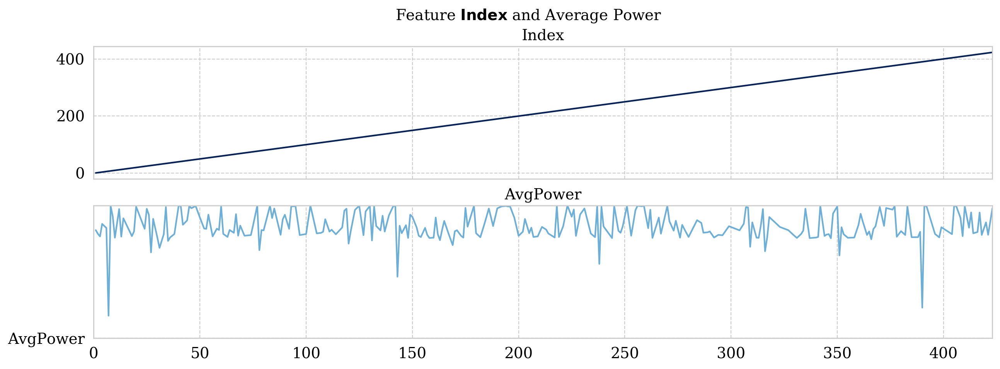

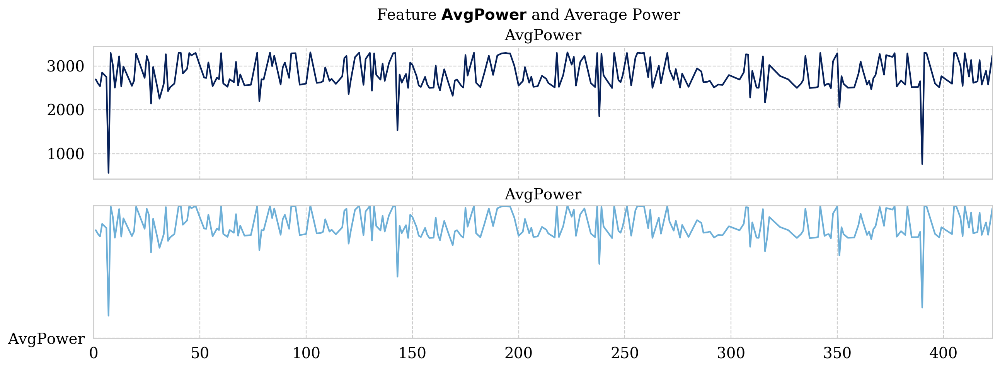

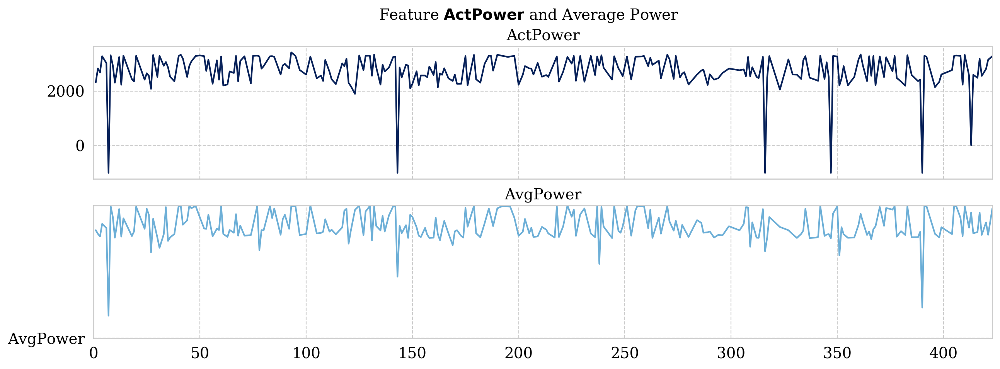

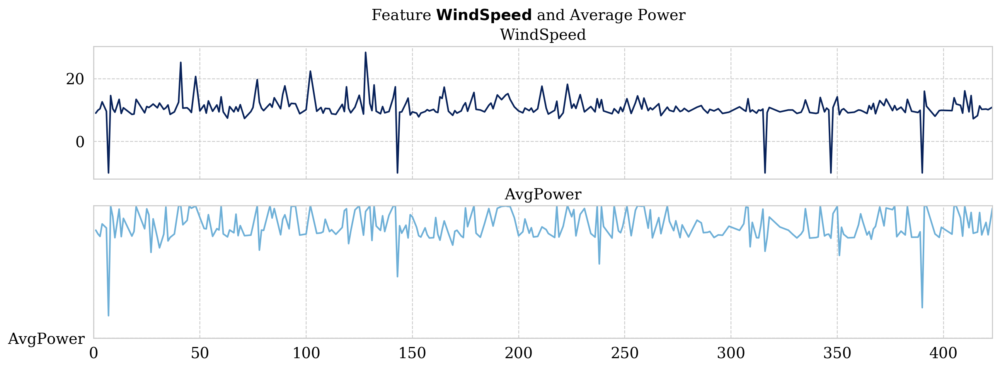

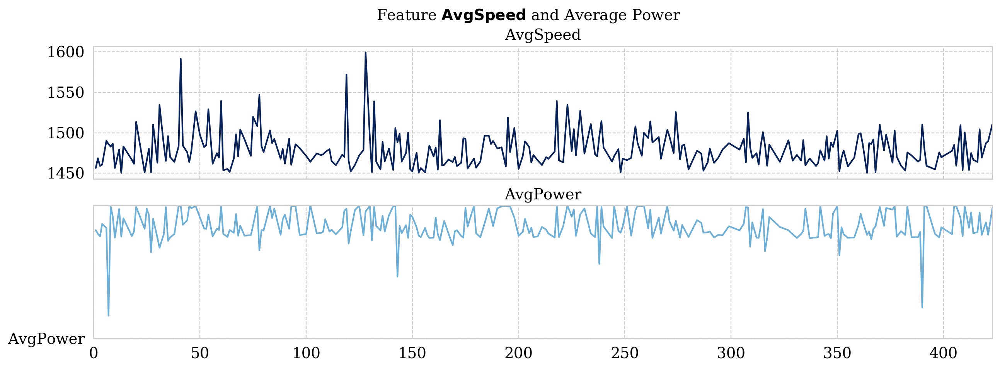

...

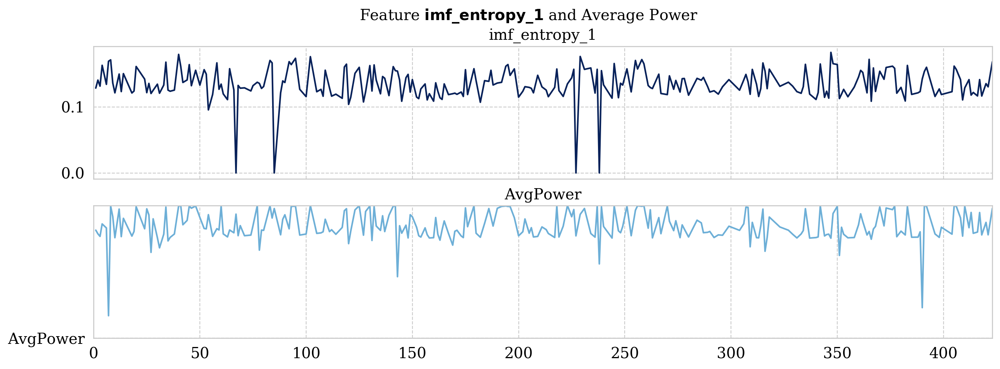

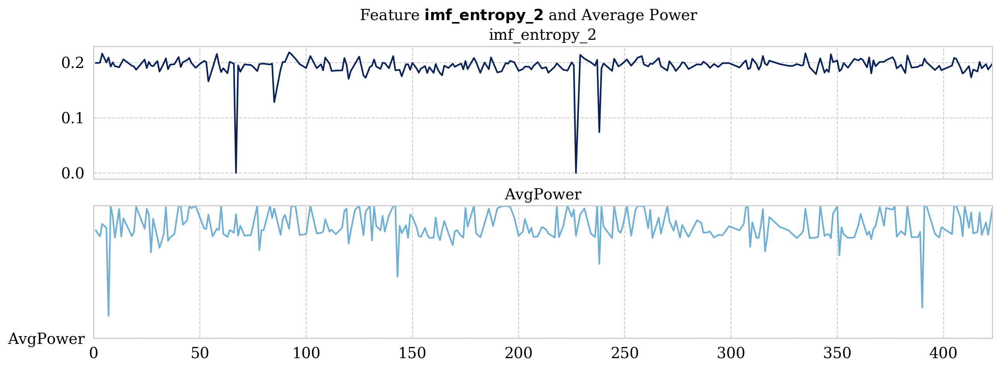

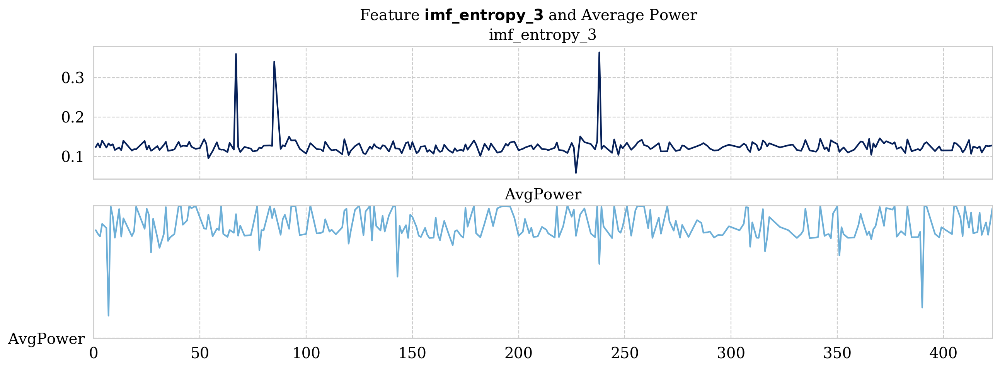

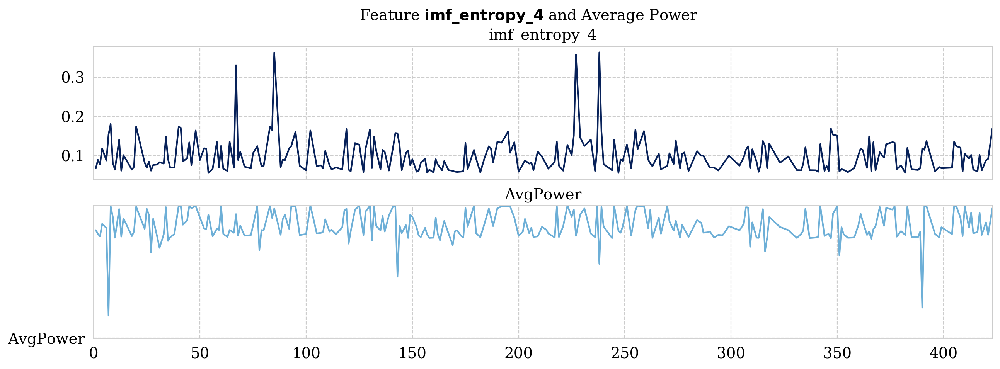

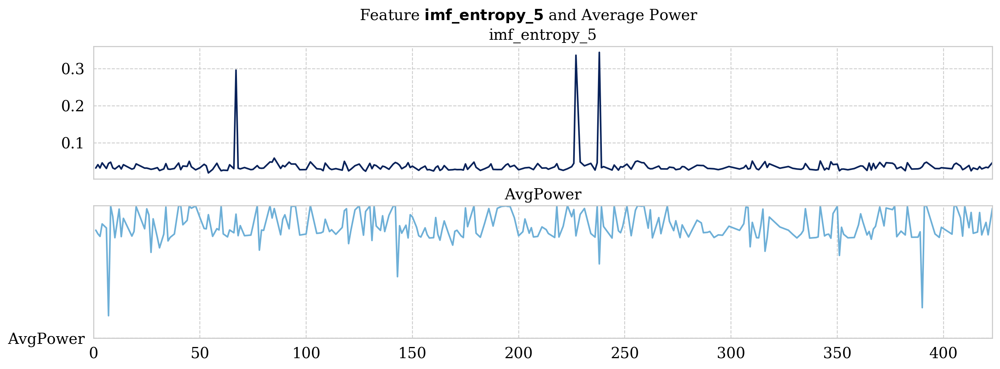

In [304]:
for feat in features_cleaned.columns:
    if (len(feat.split('_'))>2):
        feat_name=(str(feat.split('_')[0])+ '\_' + str(feat.split('_')[1])+ '\_' + str(feat.split('_')[2]))
    elif (len(feat.split('_'))>1):
        feat_name=(str(feat.split('_')[0])+ '\_' + str(feat.split('_')[1]))
    else:
        feat_name=feat
    fig, axs=plt.subplots(2,1,figsize=(15,5),sharex=True,sharey=False)
    fig.suptitle("Feature " + r"$\bf{"+str(feat_name) + "}$ and Average Power",fontsize=14)
    axs[0].title.set_text(feat)
    axs[0].plot(features_cleaned['Index'],features_cleaned[feat])
    axs[1].plot(features_cleaned['Index'],features_cleaned['AvgPower'],c='#6DAFD7')
    axs[1].plot('AvgPower')
    axs[1].title.set_text('AvgPower')
    plt.margins(0)
    plt.show()

## Correlation plot

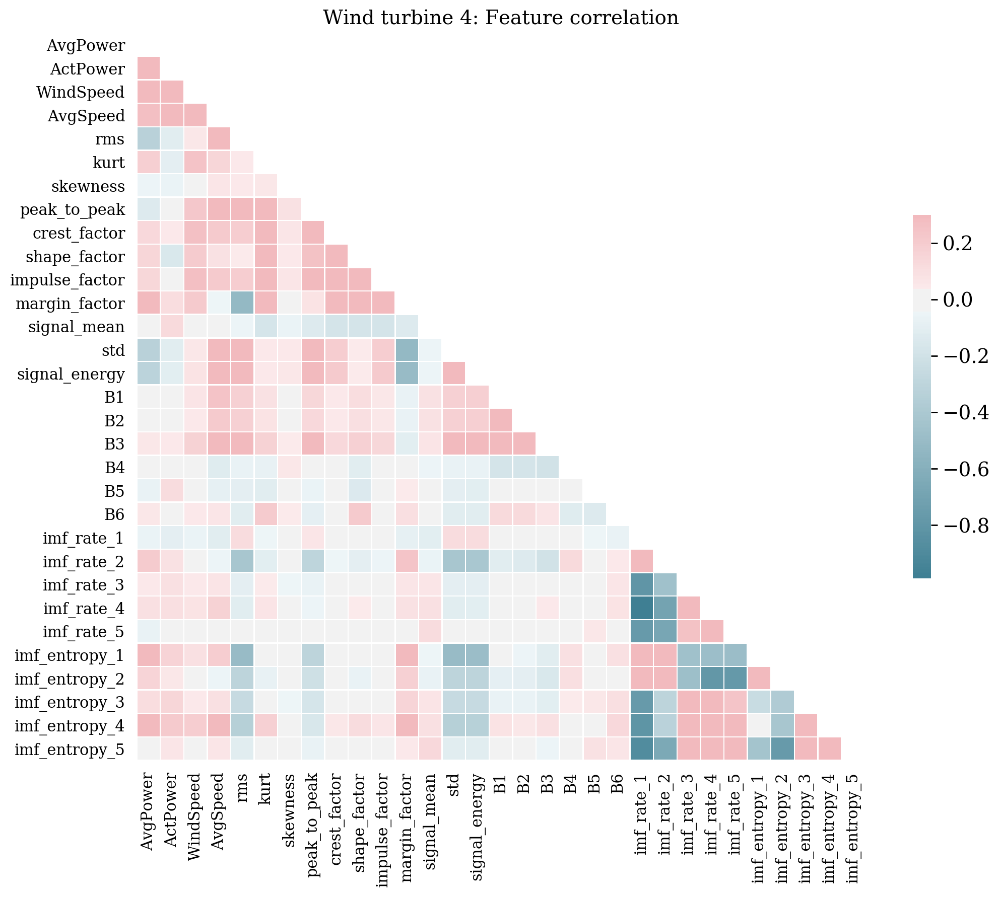

In [309]:
features_cleaned_corr = features_cleaned.drop(['Index'],axis=1)
correlation_plot.create_save_correlation_plot('wt04_features','Wind turbine 4: Feature correlation',features_cleaned_corr)

# Clustering

Less than 0.


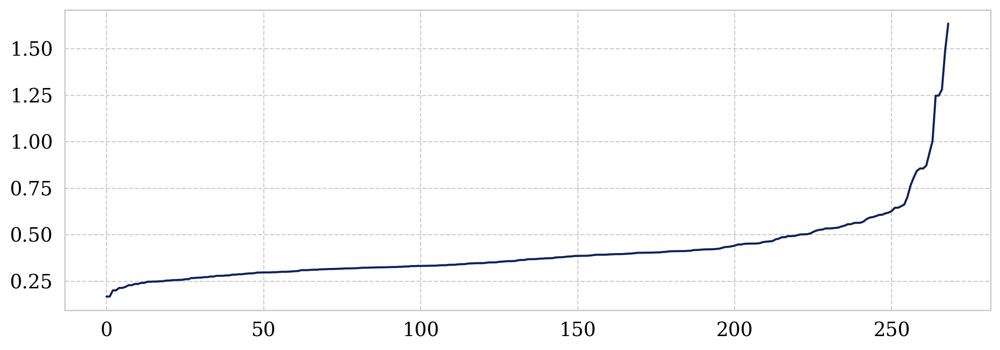

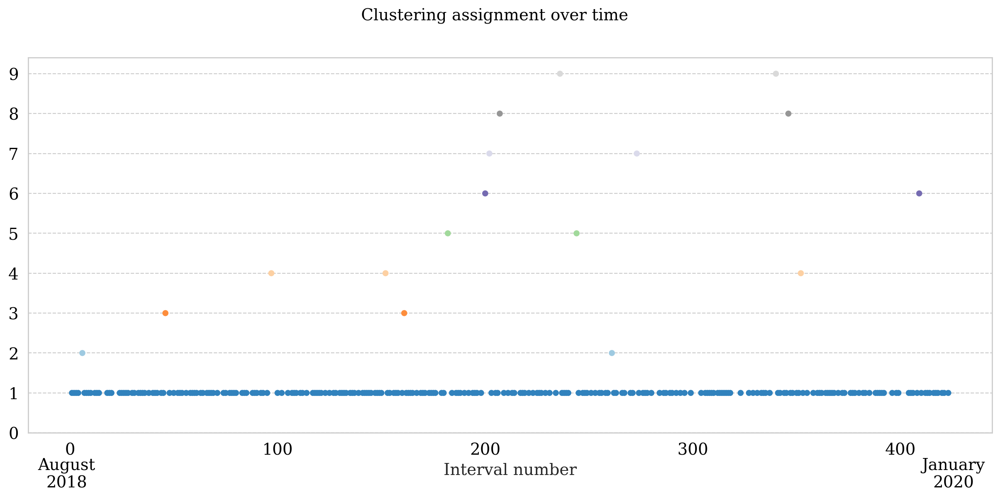

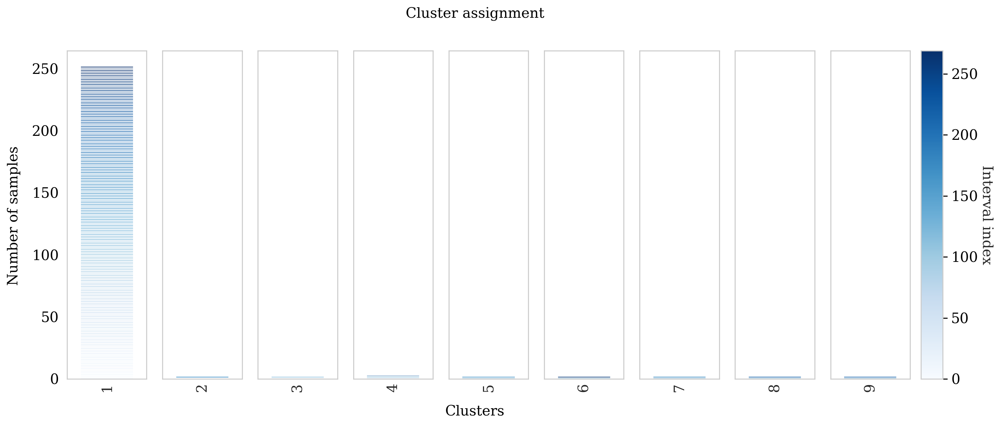

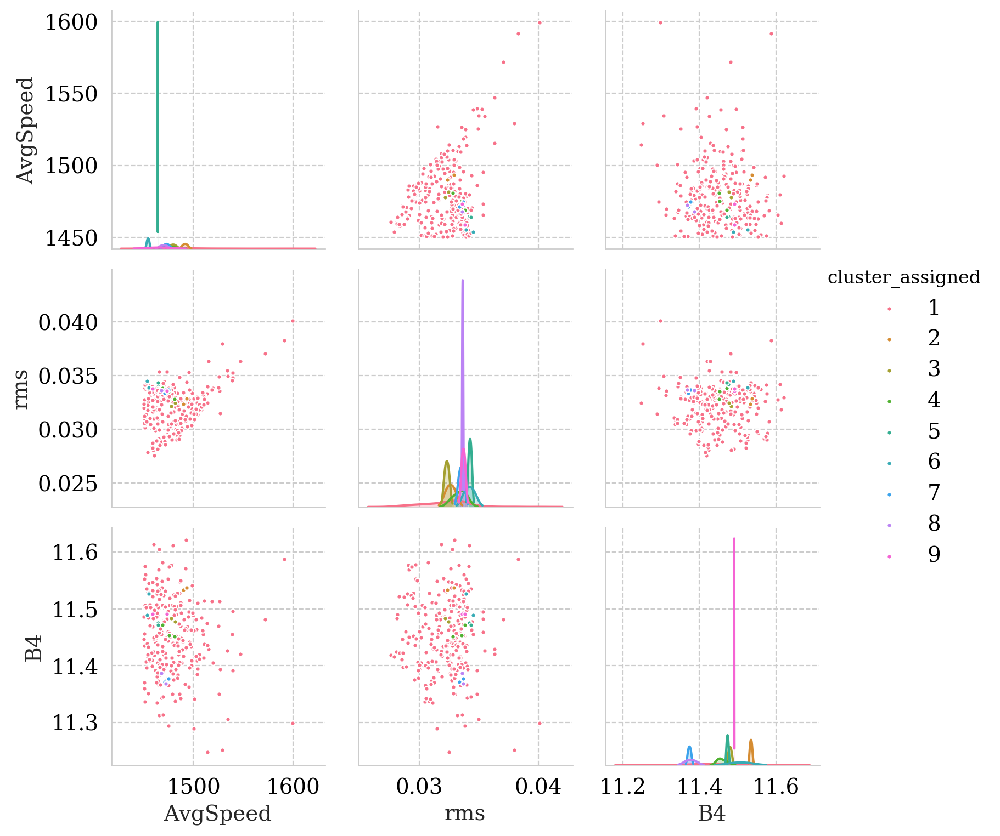

In [322]:
cluster_labels,cluster_map = clustering.db_scan_clustering(features_cleaned,'raw',eps=0.42,pca_components=10) # Cluster the points
clustering.plot_clusters(cluster_labels) # plot the clusters,
clustering.plot_clusters_pair_plot(features_cleaned, ['AvgSpeed','rms','B4'],cluster_labels) # pair plot

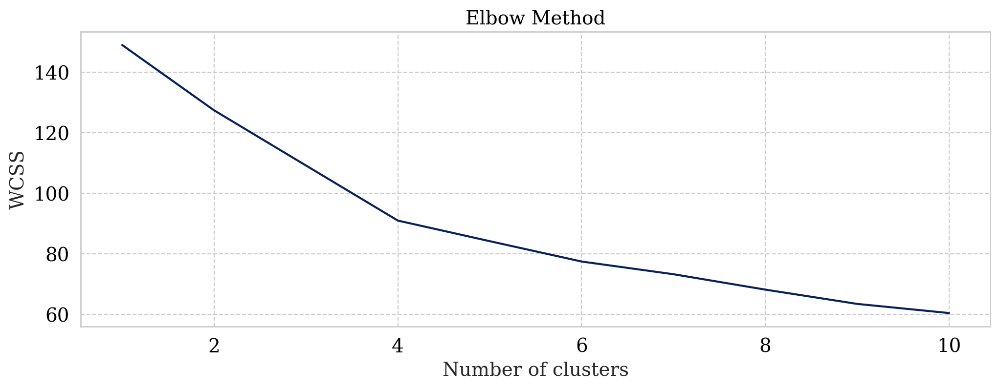

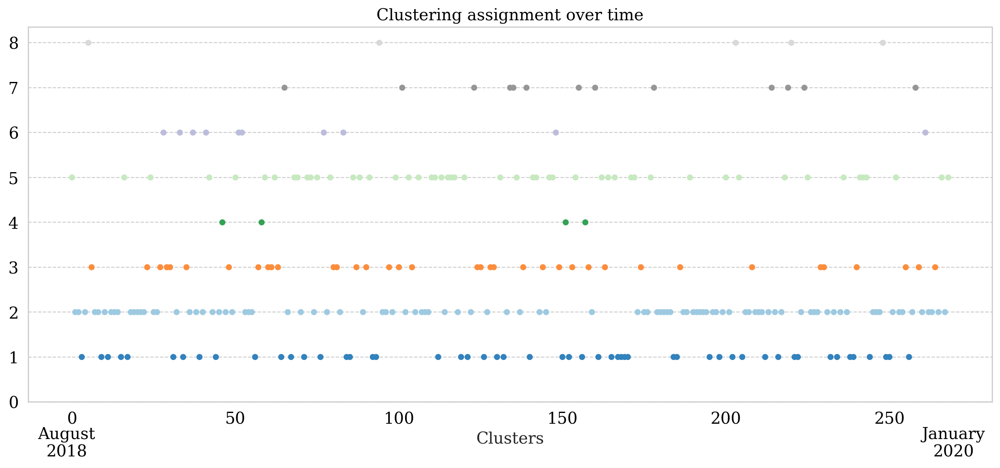

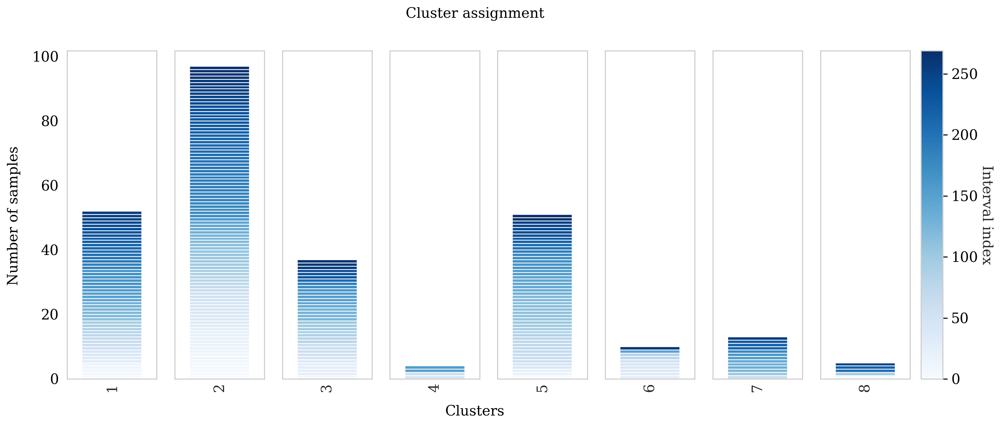

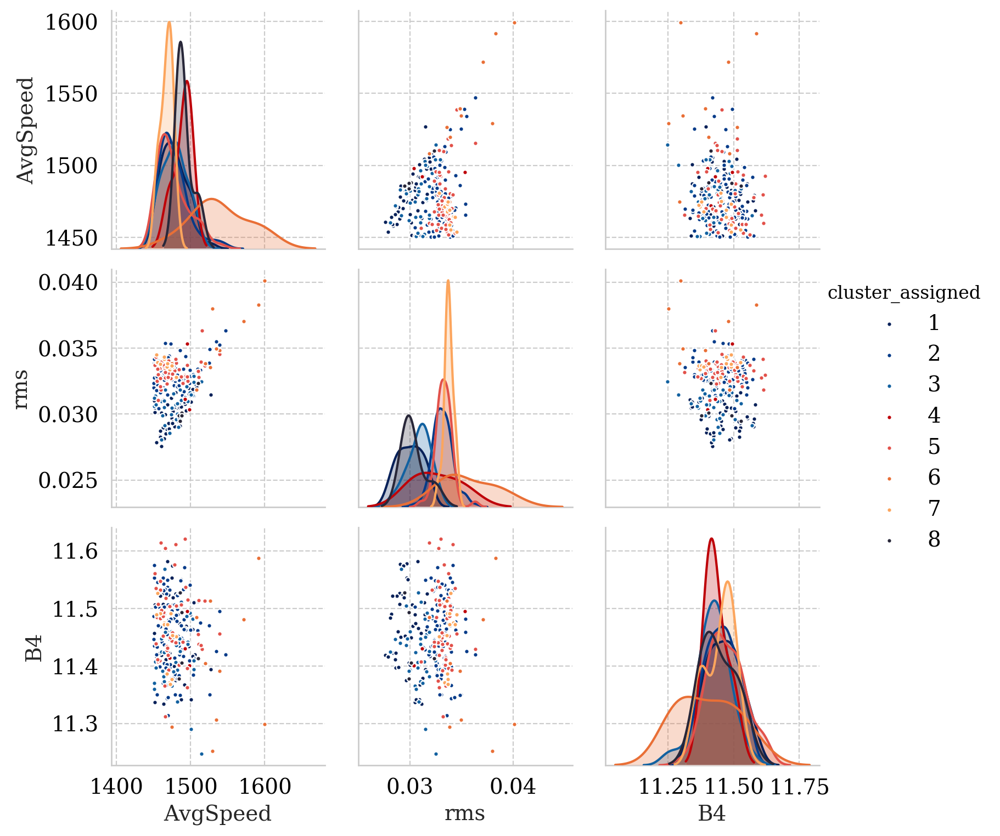

In [318]:
cluster_labels = clustering.db_scan_clustering(features_cleaned,'knn',eps=0.42,pca_components=10) # Cluster the points
clustering.plot_clusters(cluster_labels) # plot the clusters,
clustering.plot_clusters_pair_plot(features_cleaned, ['AvgSpeed','rms','B4'],cluster_labels) # pair plot

In [149]:
features_cleaned

,Index,AvgPower,ActPower,WindSpeed,NacelleDirection,AvgSpeed,rms,kurt,skewness,peak_to_peak,...,imf_rate_2,imf_rate_3,imf_rate_4,imf_rate_5,imf_entropy_1,imf_entropy_2,imf_entropy_3,imf_entropy_4,imf_entropy_5,cluster_assigned
1,1,2697.461426,2332.100098,9.1,256.100006,1456.464986,0.033015,0.053185,-0.000215,130.032981,...,0.078365,0.037746,0.016398,0.006580,0.128934,0.199547,0.123689,0.067405,0.033058,15
2,2,2606.151855,2843.500000,10.0,240.199997,1468.503663,0.031462,0.040718,0.001279,105.448202,...,0.078544,0.042036,0.023967,0.008934,0.141049,0.199823,0.133223,0.089423,0.042151,3
3,3,2541.849854,2694.100098,10.5,71.099998,1458.875183,0.031657,0.024448,-0.000109,106.522959,...,0.078703,0.037294,0.019931,0.006629,0.131875,0.200069,0.122657,0.078038,0.033254,16
4,4,2853.304199,3293.399902,12.7,269.399994,1460.635409,0.027586,-0.023993,0.000146,88.924185,...,0.089968,0.045235,0.035535,0.010240,0.163514,0.216670,0.140043,0.118589,0.046916,4
6,6,2752.077881,3040.300049,9.7,143.899994,1490.140485,0.032342,0.001400,0.000229,108.431536,...,0.078963,0.037195,0.023331,0.006302,0.134606,0.200470,0.122431,0.087678,0.031932,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
417,417,3138.052002,3203.399902,11.4,293.899994,1504.263633,0.032898,0.020255,-0.001694,110.825996,...,0.079590,0.038499,0.028754,0.007567,0.141823,0.201432,0.125395,0.102048,0.036957,2
418,418,2579.166504,2568.500000,10.3,266.500000,1469.268894,0.034313,0.022511,-0.001152,109.646701,...,0.072288,0.031943,0.014835,0.005981,0.116881,0.189908,0.110006,0.062467,0.030619,18
420,420,2891.829346,2819.300049,10.4,318.600006,1487.214505,0.032864,0.013819,-0.000442,118.000328,...,0.077006,0.039393,0.023558,0.007114,0.135683,0.197433,0.127404,0.088303,0.035183,19
421,421,2581.525879,3160.600098,10.2,317.000000,1489.520070,0.032324,-0.009423,0.001826,107.326121,...,0.070978,0.038648,0.024891,0.006794,0.130820,0.187764,0.125732,0.091929,0.033915,3


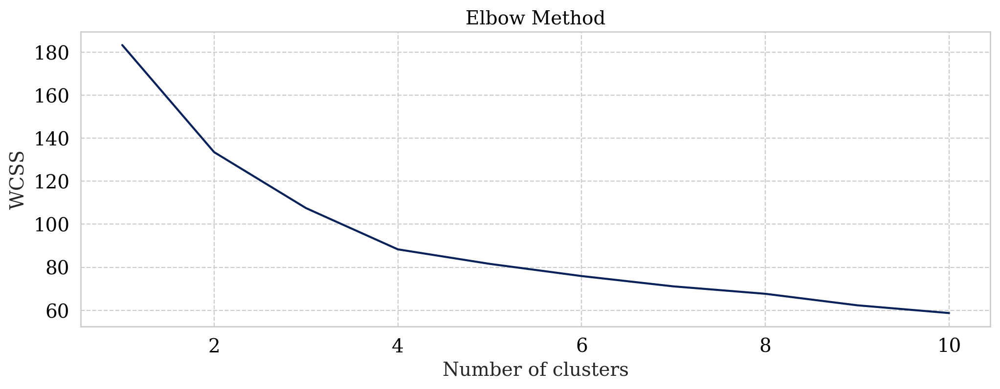

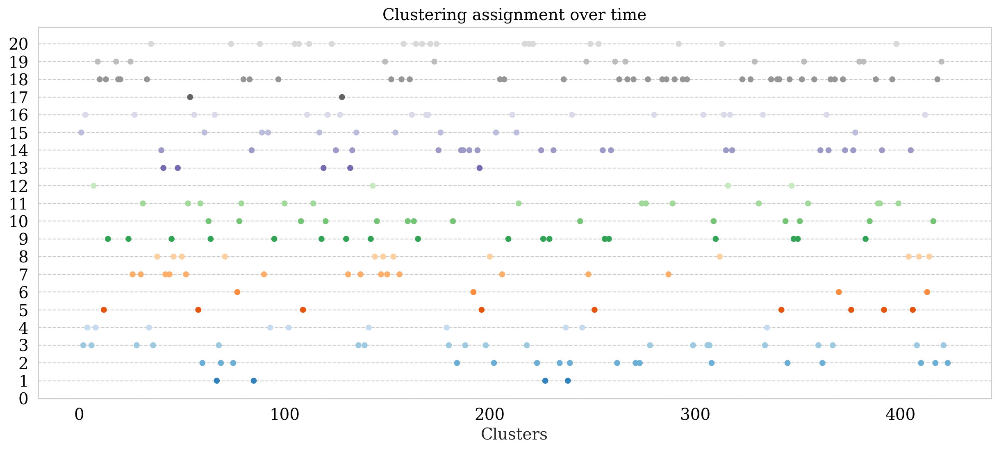

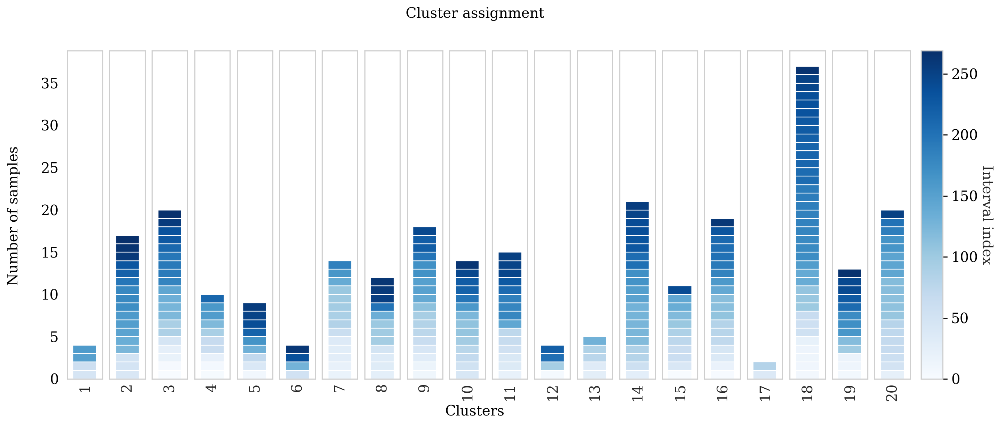

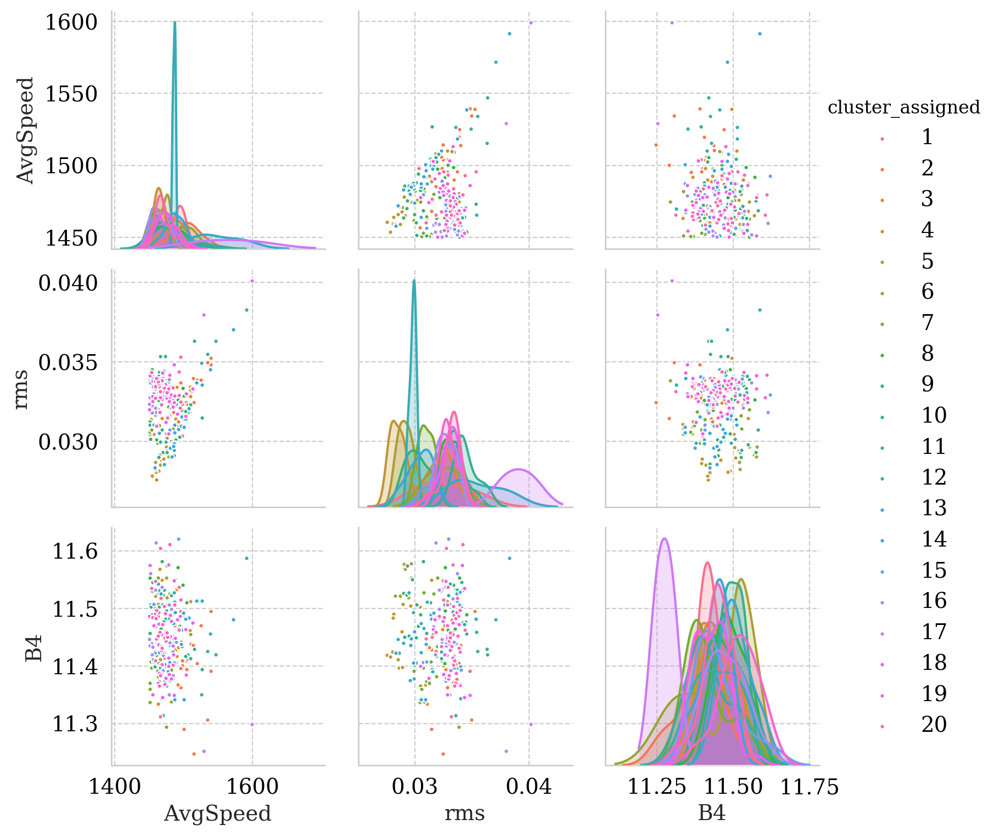

In [148]:
# Clustering
cluster_labels = clustering.db_scan_clustering(features_cleaned,'knn',eps=0.39,pca_components=10,knn_clusters=20) # Cluster the points
clustering.plot_clusters(cluster_labels) # plot the clusters,
clustering.plot_clusters_pair_plot(features_cleaned, ['AvgSpeed','rms','B4'],cluster_labels) # pair plot